In [1]:
%load_ext autoreload

In [2]:
import random
import sys, os
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt



if not "../data_processing" in sys.path:
    sys.path.append("../data_processing")

%autoreload
import build_dataset
import dataframe_exploration

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
print("ROOT", ROOT_PATH)
module_path = os.path.abspath(os.path.join(ROOT_PATH+"/utils/"))
if module_path not in sys.path:
    print("appended")
    sys.path.append(module_path)

import functions as f

c, p = f.color_palette()
sns.set(context='paper', style='whitegrid', palette=np.array(p))
print(ROOT_PATH)
plt.style.use('file://' + ROOT_PATH + "/utils/plotparams.rc")

ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
appended
/Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
ROOT /Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src
/Users/mortenolsenosvik/Documents/NTNU/Master/master-thesis/src


In [3]:
wt_instance = build_dataset.wt_data.load_instance("WTG02",load_minimal=False)



Loading WTG02...
Loaded WTG02


In [4]:
# ----- Used to create and build a csv file of the data set -----

'''
df = build_dataset.create_rms_datasets_for_one_component(wt_instance, 'GbxHssRr;0,0102;m/s2', 
                                                         power_threshold=0,plot=False, bins=50, 
                                                         plot_vertical_lines=False)

build_dataset.save_dataframe_to_csv(df, 'GbxHssRr_RMS_WTG02.csv')
'''

This is sensor name GbxHssRr;0,0102;m/s2
Type of component registered when building dataset is gearbox.


../data_processing/ff_transform.py:216: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  amp = fft_modulus_norm[filter_indexes]


419 / 425 intervals added to dataframe
Saved GbxHssRr_RMS_WTG02.csv.


### Load data set from csv file

In [7]:
path = '/Volumes/OsvikExtra/VibrationData/RMS_dataset/GbxHssRr_RMS_power>2500_WTG02.csv'
data = pd.read_csv(path)
data.head()

,AvgPower,ActPower,AvgRotSpeed,WindSpeed,NacelleDirection,GbxHssRr_RMS_0,GbxHssRr_RMS_1,GbxHssRr_RMS_2,GbxHssRr_RMS_3,GbxHssRr_RMS_4,...,GbxHssRr_RMS_40,GbxHssRr_RMS_41,GbxHssRr_RMS_42,GbxHssRr_RMS_43,GbxHssRr_RMS_44,GbxHssRr_RMS_45,GbxHssRr_RMS_46,GbxHssRr_RMS_47,GbxHssRr_RMS_48,GbxHssRr_RMS_49
0,2818.207520,3291.300049,1487.871218,14.2,226.699997,0.404392,0.258909,0.811581,0.344739,1.497359,...,1.101426,1.969857,1.778854,2.673142,3.386242,2.750154,1.419267,0.809299,0.444020,0.272188
1,2528.062988,2454.500000,1471.267571,10.6,231.699997,0.532580,0.244108,1.221325,0.346431,1.477624,...,1.106000,2.131452,1.824046,2.082840,2.086788,1.563331,0.788437,0.436628,0.294574,0.181487
2,2500.473145,1772.500000,1432.996560,8.4,284.600006,0.478452,0.210531,1.090423,0.360744,0.946055,...,0.967446,1.962500,1.463750,1.369159,1.247210,1.092017,0.519553,0.320830,0.221710,0.146560
3,2555.221924,2492.899902,1465.589029,9.0,132.000000,0.512141,0.226217,1.160659,0.358593,0.996903,...,1.068143,2.376538,1.979047,2.345064,2.218439,1.995184,0.850978,0.474515,0.348262,0.198423
4,3065.522217,3304.800049,1476.364735,12.7,245.000000,0.386640,0.276154,1.027501,0.356752,1.272245,...,1.155076,1.865711,1.766413,2.519427,3.441490,2.888474,1.341962,0.759380,0.538935,0.295528


### Correlation plot, unfiltered data set

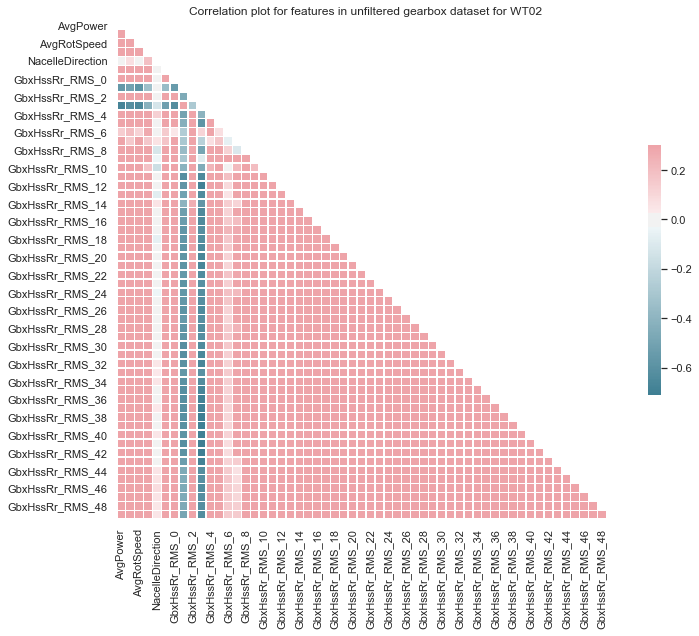

In [6]:
path = '/Volumes/OsvikExtra/VibrationData/RMS_dataset/GbxHssRr_RMS_WTG02.csv'
save_to_file_name = "Correlation_plot_wtg02_Gearbox"
plot_title = "Correlation plot for features in unfiltered gearbox dataset for WT02"

dataframe_exploration.create_save_correlation_plot(path, save_to_file_name, plot_title)

### Correlation plot, filtered data set

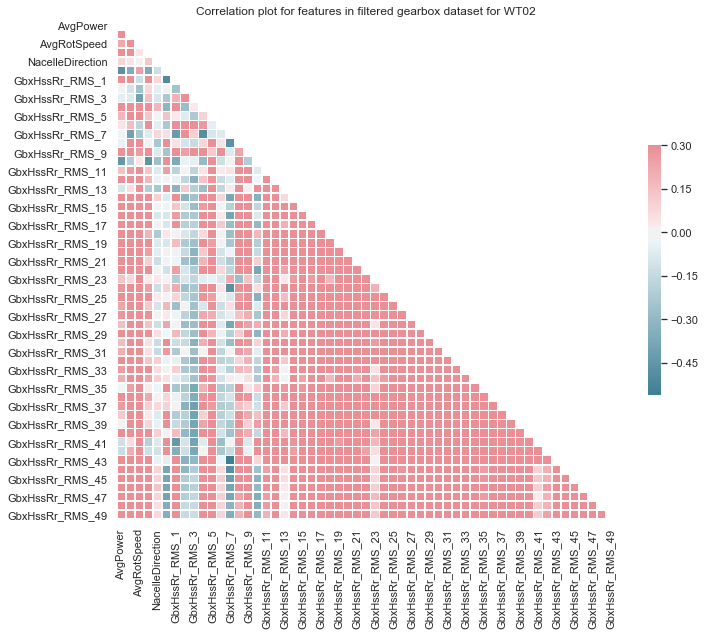

In [7]:
path = '/Volumes/OsvikExtra/VibrationData/RMS_dataset/GbxHssRr_RMS_power>2500_WTG02.csv'
save_to_file_name = "Correlation_plot_wtg02_Gearbox"
plot_title = "Correlation plot for features in filtered gearbox dataset for WT02"

dataframe_exploration.create_save_correlation_plot(path, save_to_file_name, plot_title)

## Plot average rot speed (high speed shaft) for all intervals with avg_power > 2500

color codes: 
red: hgih rot speed which gives high rms values in bin 5

yellow: low rot speeds which gives high rms values in bin 1,2 or 3. The first line at interval 30 (with very low 
rot speed) has only high rot speed in bin 1

light blue: high rot speed but regular rms values

green horisontal line: 1550 rpm (rotational speed)

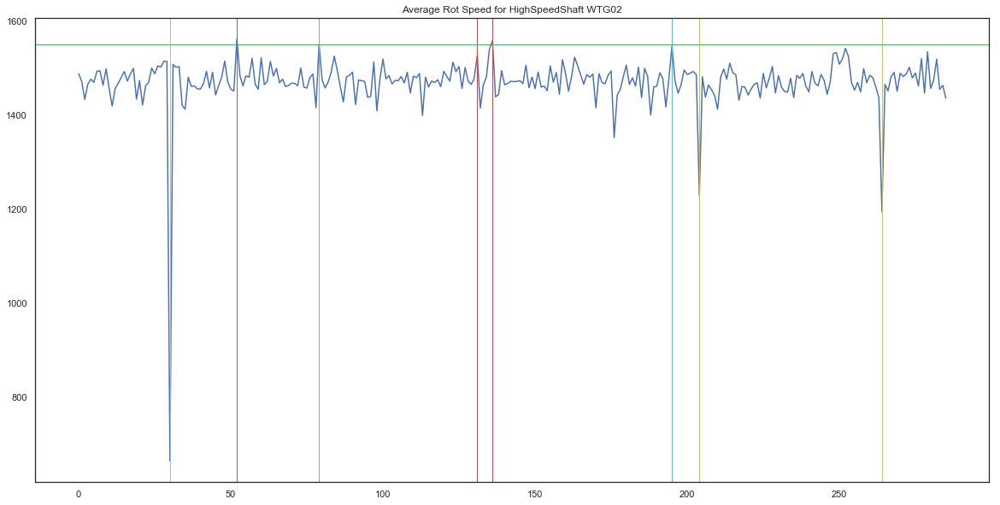

In [8]:
x = np.arange(data.shape[0])
y = data['AvgRotSpeed']
plt.figure(figsize=(20,10))
plt.title('Average Rot Speed for HighSpeedShaft WTG02')
plt.plot(x, y)
plt.axvline(x=30,  c='y', linewidth=1)
plt.axvline(x=52,  c='r', linewidth=1)
plt.axvline(x=79,  c='c', linewidth=1)
plt.axvline(x=131, c='r', linewidth=1)
plt.axvline(x=136, c='r', linewidth=1)
plt.axvline(x=195, c='c', linewidth=1)
plt.axvline(x=204, c='y', linewidth=1)
plt.axvline(x=264, c='y', linewidth=1)
plt.axhline(y=1550, c='g', linewidth=1)
plt.show()

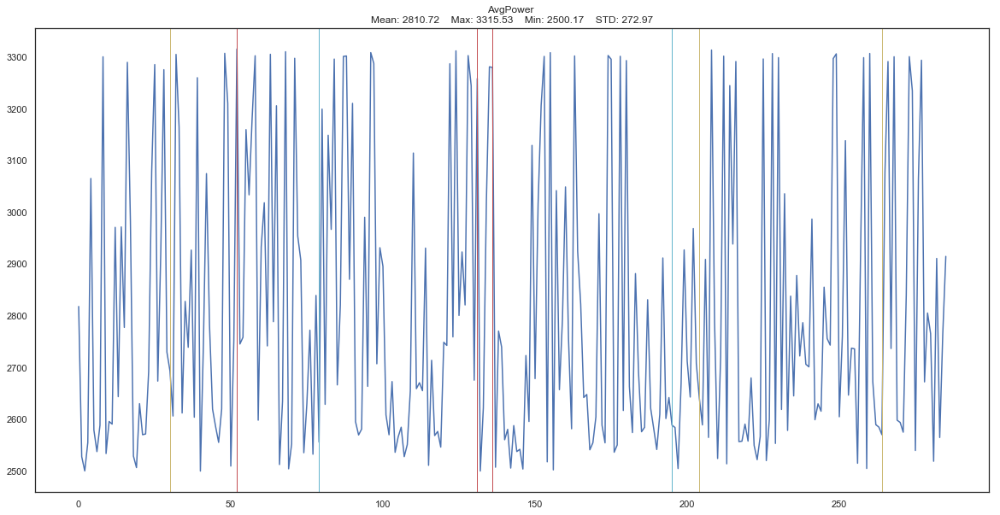

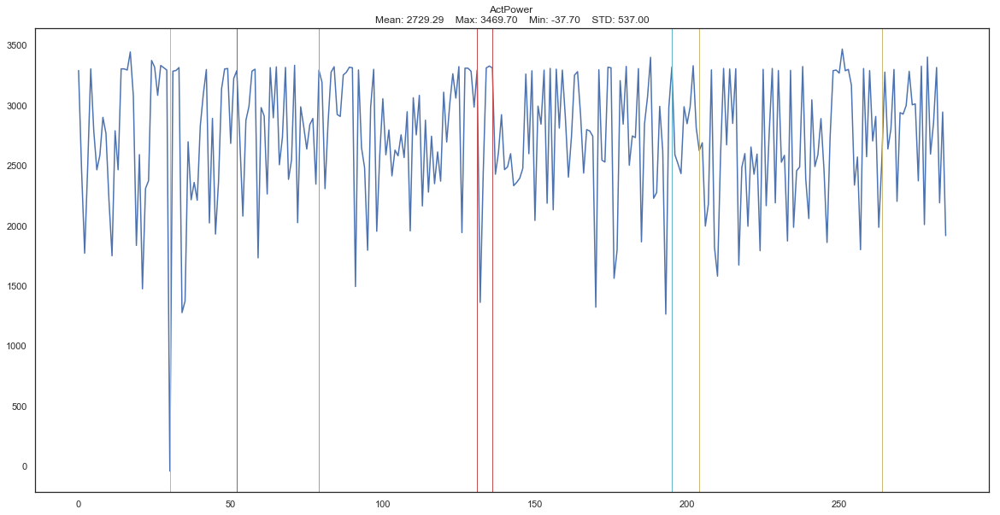

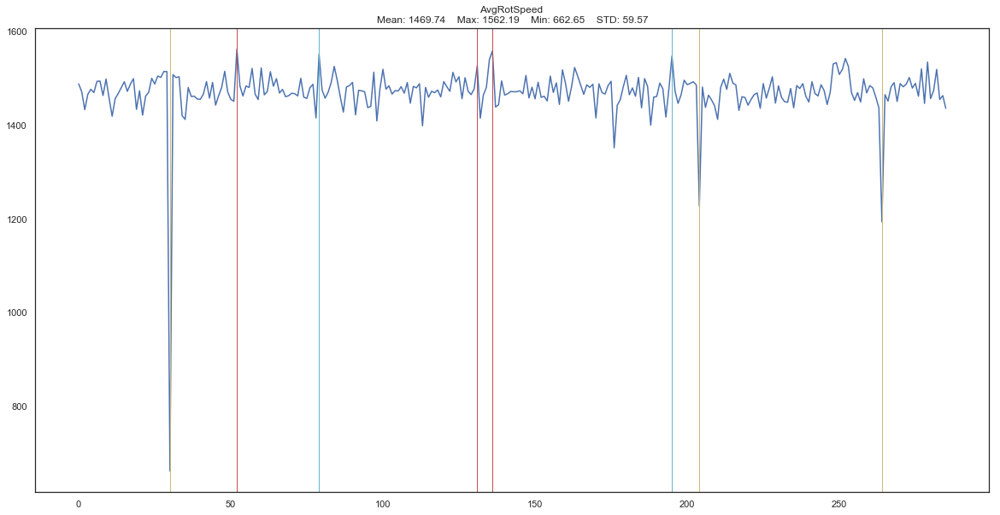

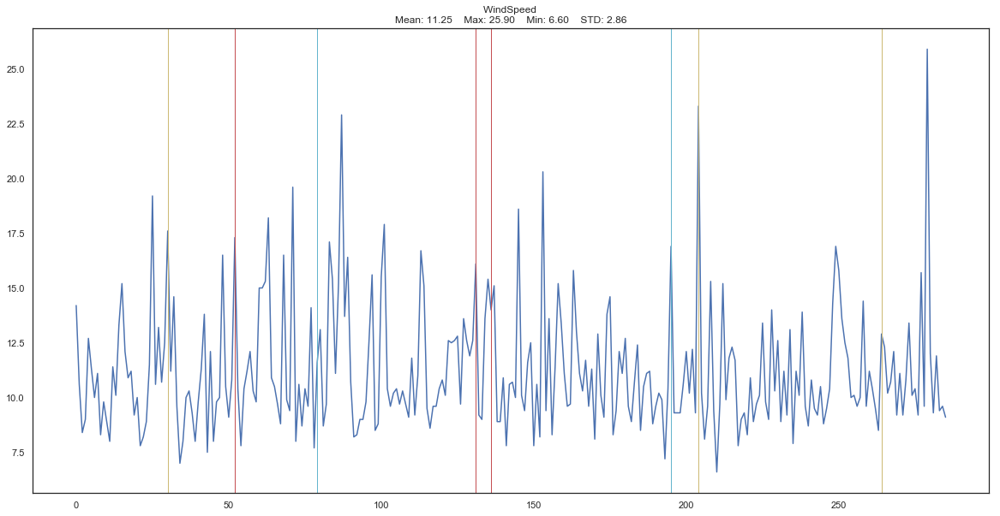

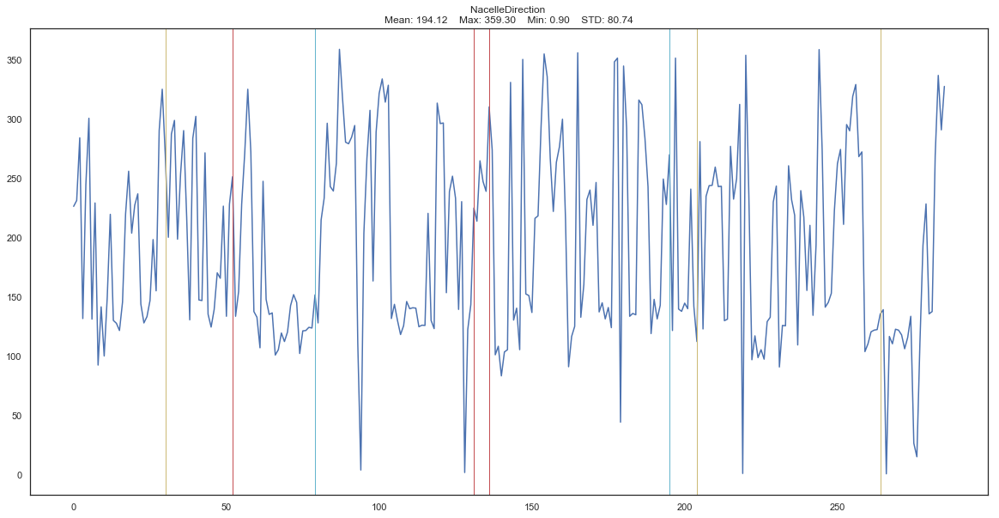

...

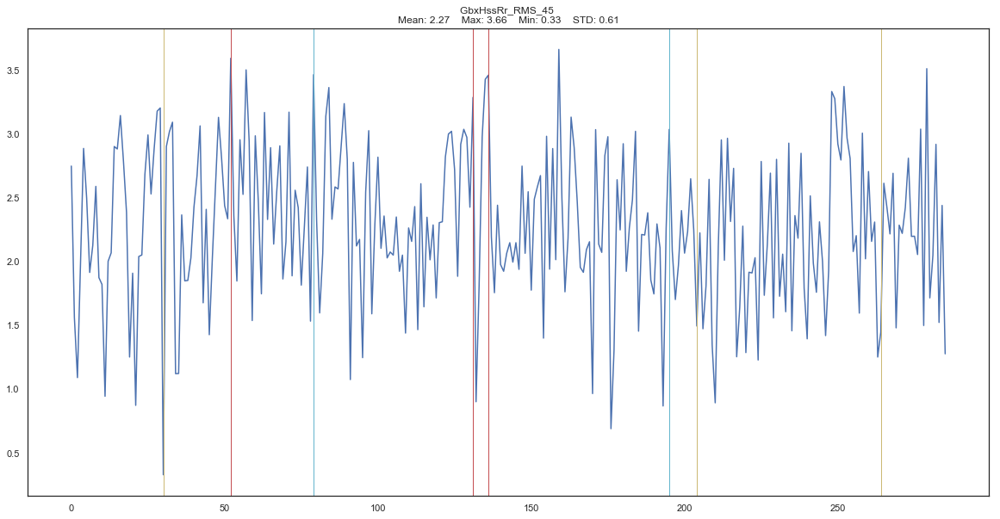

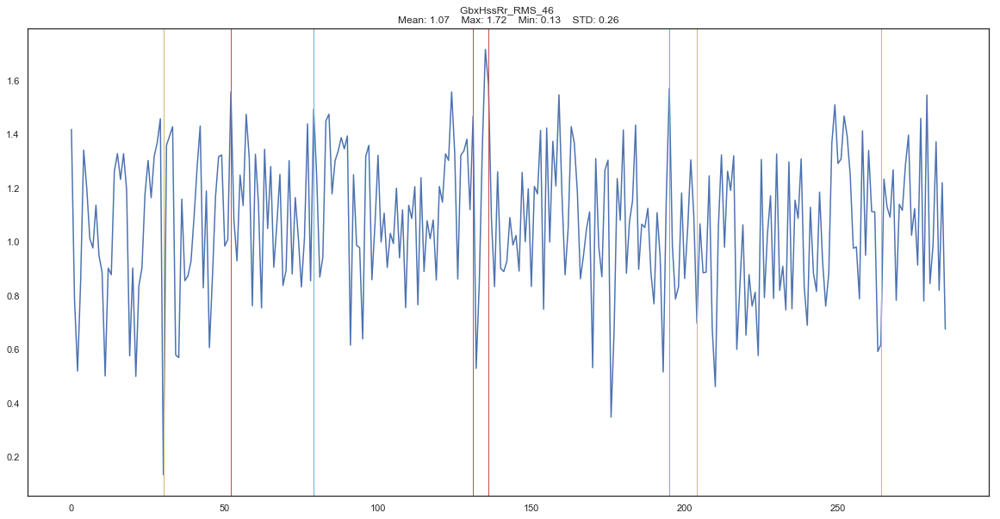

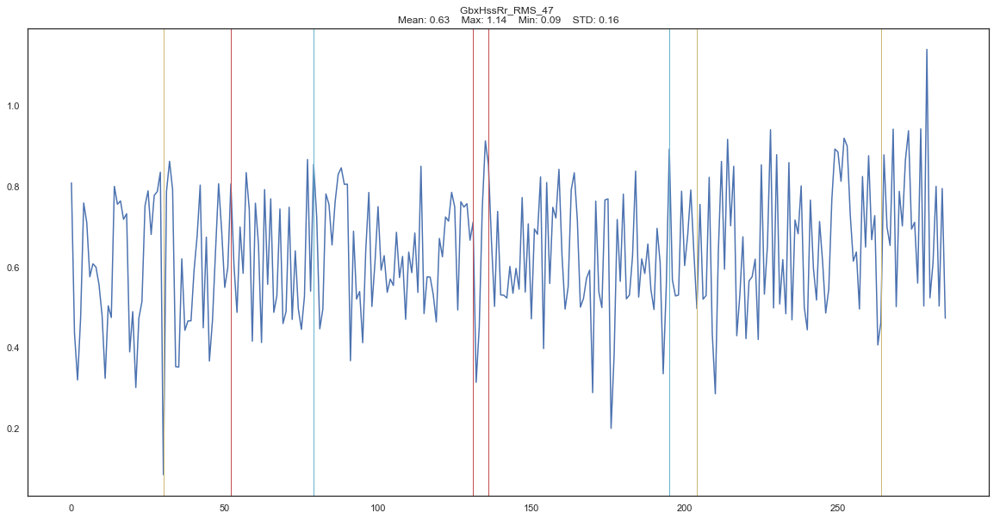

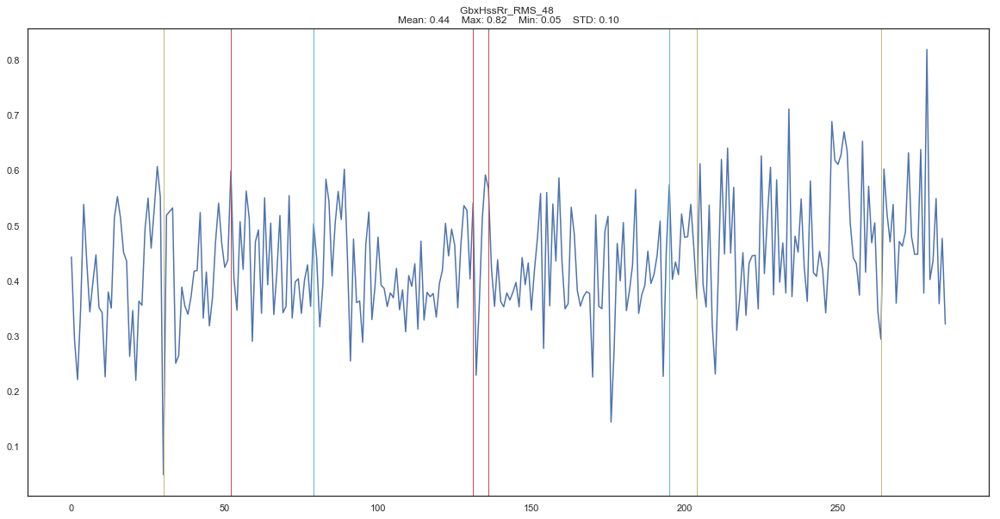

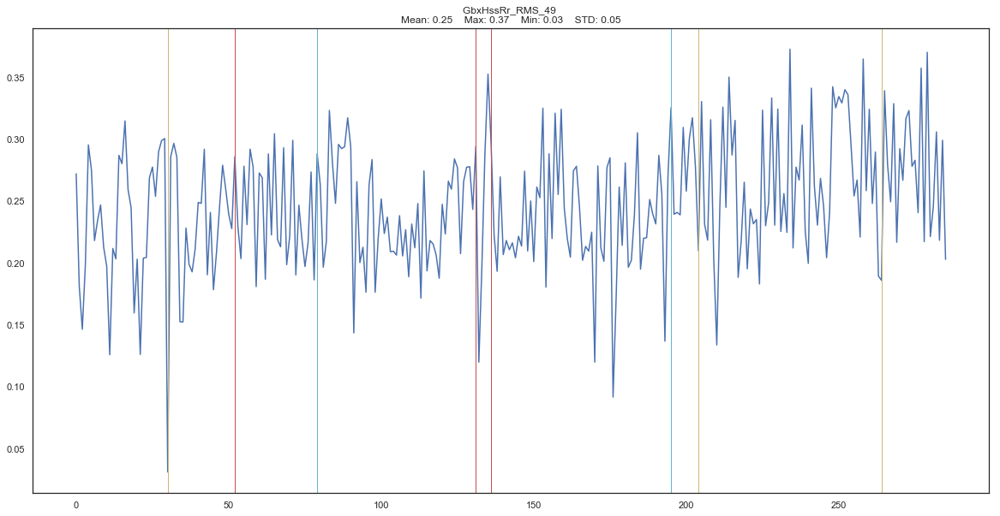

In [9]:
x=np.arange(len(data))
for i, name in enumerate(data.columns):
    plt.figure(figsize=(20,10))
    y = data.values[:,i]
    mean_val = np.mean(y)
    max_val = np.max(y)
    min_val = np.min(y)
    std_val = np.std(y)
    plt.title(f'{name} \nMean: {mean_val:.2f}    Max: {max_val:.2f}    Min: {min_val:.2f}    STD: {std_val:.2f}')
    plt.plot(x, y)
    plt.axvline(x=30,  c='y', linewidth=1)
    plt.axvline(x=52,  c='r', linewidth=1)
    plt.axvline(x=79,  c='c', linewidth=1)
    plt.axvline(x=131, c='r', linewidth=1)
    plt.axvline(x=136, c='r', linewidth=1)
    plt.axvline(x=195, c='c', linewidth=1)
    plt.axvline(x=204, c='y', linewidth=1)
    plt.axvline(x=264, c='y', linewidth=1)
    plt.show()

In [10]:
print('Yellow lines: ')
print(f"AvgPower value at first low rot speed: {data.iloc[30]['AvgPower']}")
print(f"AvgPower value at second low rot speed: {data.iloc[204]['AvgPower']}")
print(f"AvgPower value at third low rot speed: {data.iloc[264]['AvgPower']}")
print('\nRed lines: ')
print(f"AvgPower value at first peak in bin 5: {data.iloc[52]['AvgPower']}")
print(f"AvgPower value at second peak in bin 5: {data.iloc[131]['AvgPower']}")
print(f"AvgPower value at third peak in bin 5: {data.iloc[136]['AvgPower']}")
print('\nBlue lines')
print(f"AvgPower value at second high rot speed: {data.iloc[79]['AvgPower']}")
print(f"AvgPower value at fifth high rot speed: {data.iloc[195]['AvgPower']}")

Yellow lines: 
AvgPower value at first low rot speed: 2693.899658203
AvgPower value at second low rot speed: 2640.591552734
AvgPower value at third low rot speed: 2570.507568359

Red lines: 
AvgPower value at first peak in bin 5: 3315.529296875
AvgPower value at second peak in bin 5: 3258.451660156
AvgPower value at third peak in bin 5: 3279.9111328129998

Blue lines
AvgPower value at second high rot speed: 2556.181640625
AvgPower value at fifth high rot speed: 2588.951660156


In [66]:
%autoreload
import build_dataset

## Plot frequency spectrum of interesting data points
Use AvgPower value to find the correct interval

In [39]:
interesting_intervals = [30, 52, 79, 131, 136, 195, 204, 264]
pwr_values = []
for interval in interesting_intervals:
    pwr_values.append(float(f"{data.iloc[interval]['AvgPower']:.9f}"))

pwr_values

[2693.899658203,
 3315.529296875,
 2556.181640625,
 3258.451660156,
 3279.911132813,
 2588.951660156,
 2640.591552734,
 2570.507568359]

This is sensor name GbxHssRr;0,0102;m/s2
Type of component registered when building dataset is gearbox.



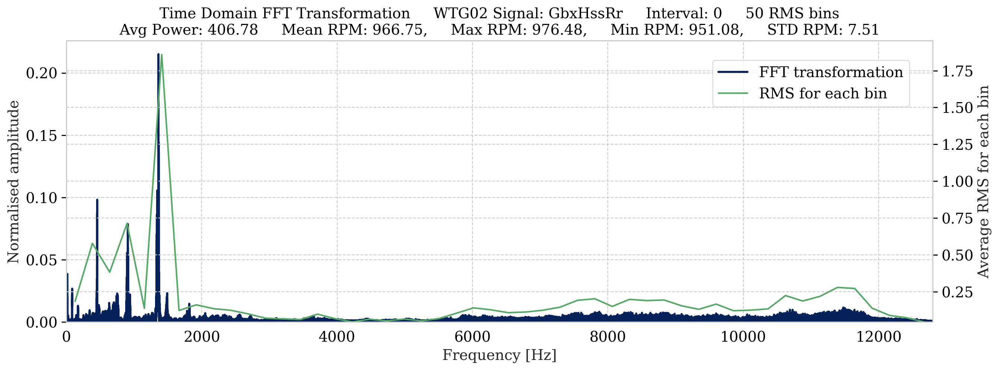

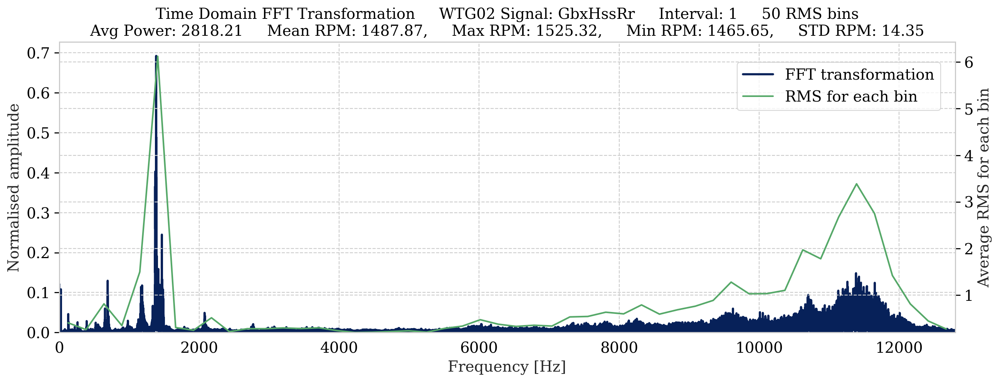

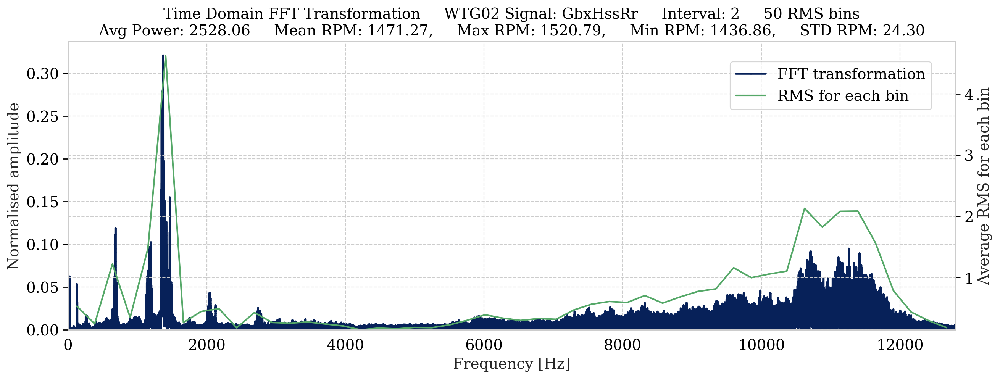

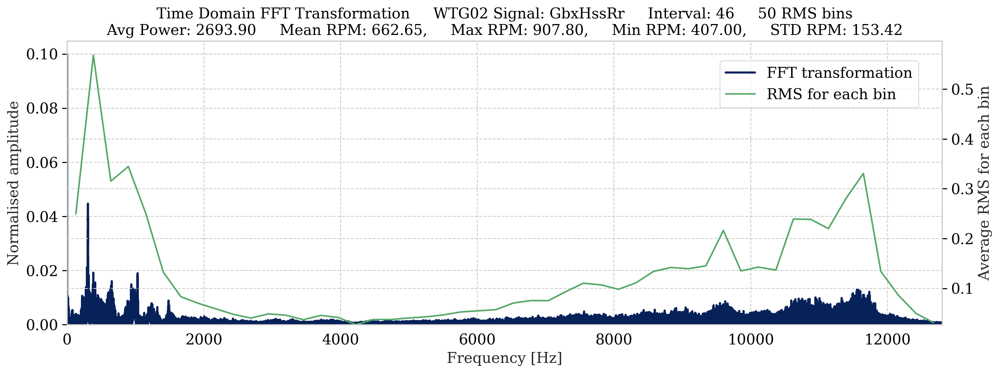

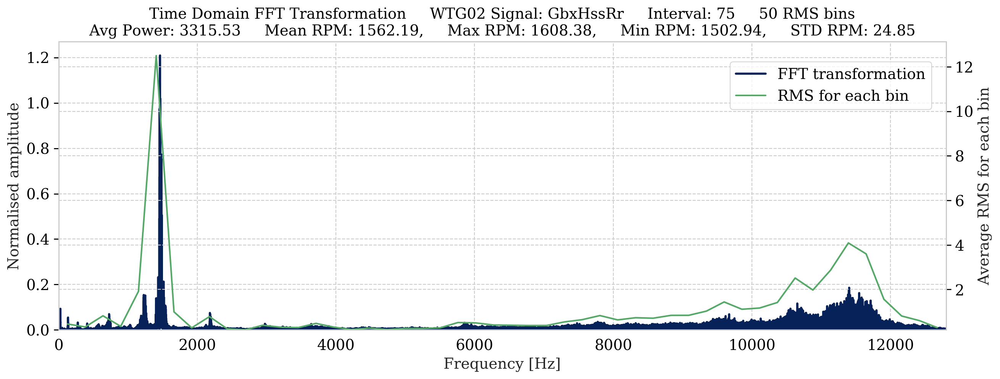

...

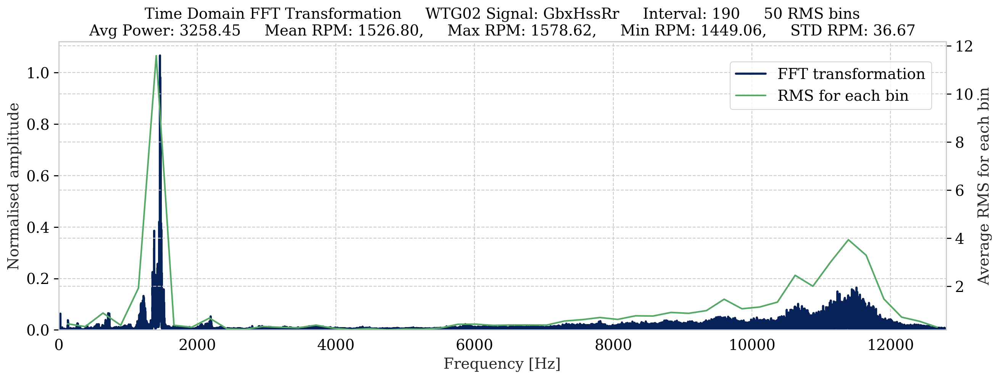

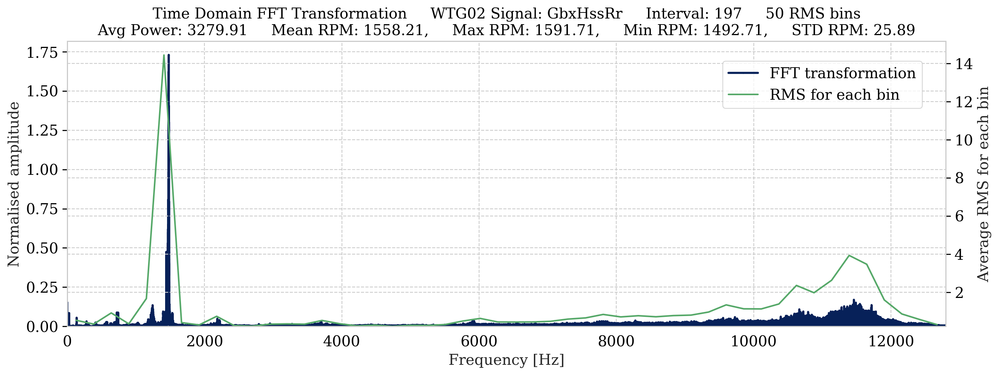

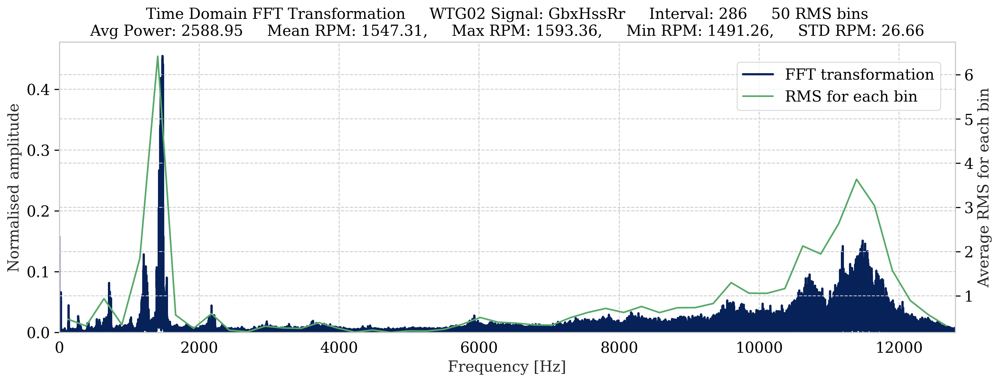

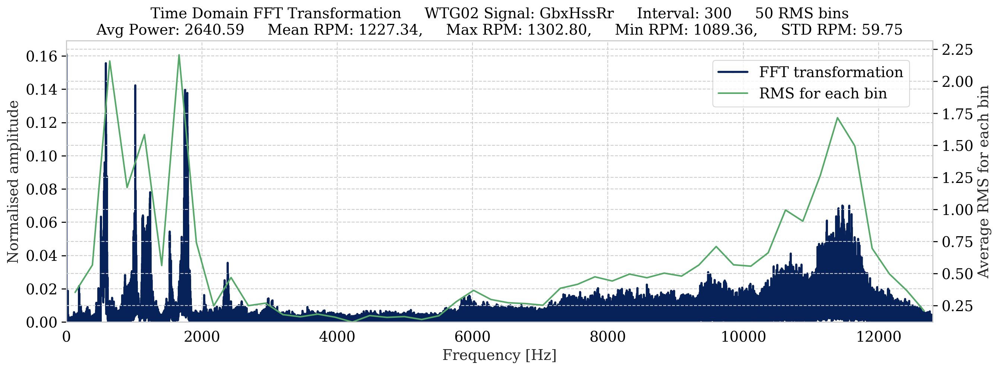

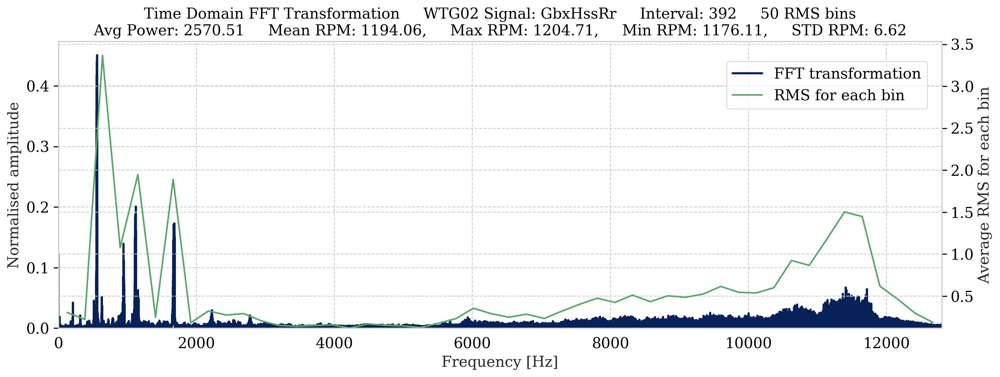

11 / 425 intervals added to dataframe


In [68]:
df = build_dataset.create_rms_datasets_for_one_component(wt_instance, 
                                                         'GbxHssRr;0,0102;m/s2', 
                                                         power_threshold=0,
                                                         rpm_threshold=0,
                                                         spectrum_type='time',
                                                         get_rms_for_bins=True,
                                                         plot=True, 
                                                         bins=50, 
                                                         plot_bin_lines=False,
                                                         x_lim=None,
                                                         frequency_lines=[],
                                                         horisontal_lines=[],
                                                         avg_pwr_values=pwr_values,
                                                         interval_range=[0,1,2],
                                                         interpolation_method='cubic',
                                                         plot_resampling=True)

### Generate fake datapoints for the whole frequency domain

In [26]:
add = np.floor(np.random.rand(1,50)[0]*3)
multi = np.random.rand(1,50)[0]
multi


array([0.61347975, 0.40731088, 0.31266834, 0.69826114, 0.77684411,
       0.70836825, 0.80384174, 0.83512519, 0.1453188 , 0.70878252,
       0.20331947, 0.57388945, 0.72202296, 0.27277322, 0.81249262,
       0.95940036, 0.72881852, 0.0382061 , 0.44706624, 0.67375581,
       0.46215868, 0.28078072, 0.72606601, 0.25589414, 0.35714389,
       0.87694668, 0.73161244, 0.92517384, 0.8207337 , 0.87521955,
       0.03466773, 0.76885365, 0.3912607 , 0.61067059, 0.21281717,
       0.58219222, 0.38430573, 0.60292809, 0.43993051, 0.26359336,
       0.966115  , 0.62852524, 0.88769651, 0.35767189, 0.6551255 ,
       0.02781427, 0.77231747, 0.42499785, 0.98913927, 0.48257397])

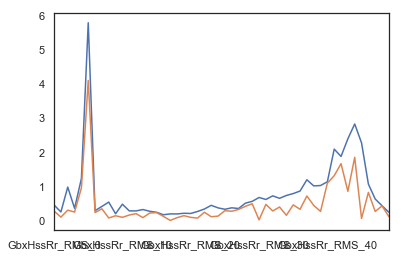

In [31]:
fake4 = data.drop(columns=['AvgPower','ActPower','AvgRotSpeed','WindSpeed','NacelleDirection']).mean()
fake4.plot()

fake5 = fake4*multi
fake5.plot()



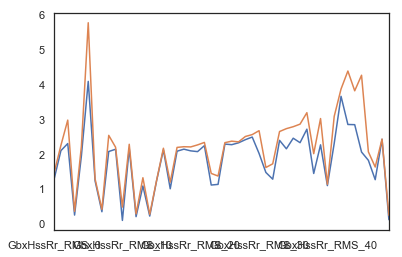

In [34]:
fake6 = fake5+add
fake6.plot()

fake7 = fake4+add
fake7.plot()

In [100]:
np.random.random_sample(1)*5

array([0.70870777])

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 2. 2. 2. 4. 3. 1. 3. 2. 4. 3. 0. 3. 0.
 2. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
[1. 2. 2. 2. 4. 3. 1. 3. 2. 4. 3. 0. 3. 0. 2.]
[10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]


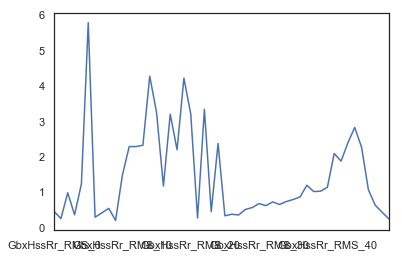

In [71]:
fake8 = np.zeros(50)
interval = np.arange(10,25)
ones = np.floor(np.random.rand(1, (len(interval)))[0]*5)
np.put(fake8, interval, ones) 
print(fake8)
print(ones)
print(interval)
fake9 = fake4 + fake8
fake9.plot()

In [14]:
rand_arr = np.random.rand(1,50)*3
rand_arr = rand_arr[0]
rand_arr

array([2.9638511 , 1.43104307, 1.01379458, 1.40334442, 0.69343219,
       1.10126205, 0.04422877, 0.80106113, 0.96869913, 1.50914326,
       2.93612789, 0.22492958, 2.87849526, 2.67464019, 2.06441684,
       2.30641383, 1.7387682 , 2.35253997, 0.36462571, 0.27386528,
       0.66915977, 1.48942847, 2.06332488, 2.42197919, 0.45826579,
       0.46751617, 2.43067913, 2.3652146 , 2.67117707, 0.43779162,
       0.59510765, 0.75451258, 1.10583499, 1.18665443, 1.38094269,
       1.26419403, 2.36964499, 0.28786767, 0.40929885, 1.27769516,
       0.76222928, 0.76010455, 0.20146981, 1.93763819, 1.90183021,
       1.88246521, 1.99874246, 1.07549746, 1.09929288, 2.68859619])

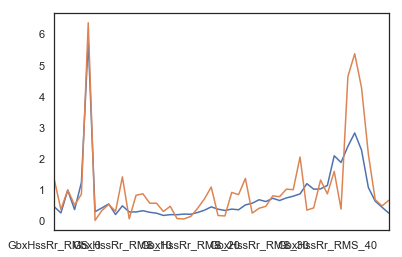

In [15]:
fake2 = data.drop(columns=['AvgPower','ActPower','AvgRotSpeed','WindSpeed','NacelleDirection']).mean()
fake2.plot()

fake3 = ((fake2 ).multiply(rand_arr) )
fake3.plot()
#(fake2+2).plot()

In [16]:
fake = pd.DataFrame(np.array(data.mean()).reshape(-1, data.shape[1]), columns=data.columns)
fake

,AvgPower,ActPower,AvgRotSpeed,WindSpeed,NacelleDirection,GbxHssRr_RMS_0,GbxHssRr_RMS_1,GbxHssRr_RMS_2,GbxHssRr_RMS_3,GbxHssRr_RMS_4,...,GbxHssRr_RMS_40,GbxHssRr_RMS_41,GbxHssRr_RMS_42,GbxHssRr_RMS_43,GbxHssRr_RMS_44,GbxHssRr_RMS_45,GbxHssRr_RMS_46,GbxHssRr_RMS_47,GbxHssRr_RMS_48,GbxHssRr_RMS_49
0,2810.722013,2729.28777,1469.740586,11.248252,194.115734,0.457509,0.25432,0.981178,0.360376,1.232012,...,1.137108,2.089491,1.87575,2.392073,2.823761,2.271125,1.069254,0.632511,0.435221,0.24616


In [17]:
fake.drop(columns=['AvgPower','ActPower','AvgRotSpeed','WindSpeed','NacelleDirection'])

,GbxHssRr_RMS_0,GbxHssRr_RMS_1,GbxHssRr_RMS_2,GbxHssRr_RMS_3,GbxHssRr_RMS_4,GbxHssRr_RMS_5,GbxHssRr_RMS_6,GbxHssRr_RMS_7,GbxHssRr_RMS_8,GbxHssRr_RMS_9,...,GbxHssRr_RMS_40,GbxHssRr_RMS_41,GbxHssRr_RMS_42,GbxHssRr_RMS_43,GbxHssRr_RMS_44,GbxHssRr_RMS_45,GbxHssRr_RMS_46,GbxHssRr_RMS_47,GbxHssRr_RMS_48,GbxHssRr_RMS_49
0,0.457509,0.25432,0.981178,0.360376,1.232012,5.780002,0.293921,0.415587,0.542896,0.202149,...,1.137108,2.089491,1.87575,2.392073,2.823761,2.271125,1.069254,0.632511,0.435221,0.24616
